In [16]:
import rioxarray
import glob
import matplotlib.pyplot as plt
import pandas as pd
import xarray as xr
from rasterio.enums import Resampling

import tqdm

In [ ]:
bounds = [-2372815.4365367997,1223632.736338646,-2369393.4320713286,1226572.1908656678]

In [20]:
# find tifs in dir
dir1 = '/Users/jkingslake/Documents/projects/current_projects/AntPen_NSF_NERC/remote sensing/worldview/6167_2025apr29_Kingslake_Historical_Imagery/imagery'
#tif_files = glob.glob(dir + '/*.tif')
dir2 = '/Users/jkingslake/Documents/projects/current_projects/AntPen_NSF_NERC/remote sensing/worldview/6155_2025apr15_Kingslake_2024_25_Imagery/imagery'
tif_files = glob.glob(dir1 + '/*.tif') + glob.glob(dir2 + '/*.tif')
len(tif_files)

178

In [21]:
for i, tif_file in enumerate(tif_files):
    print(f"Processing , {i}, {tif_file}...")
    ds_temp = rioxarray.open_rasterio(tif_file, masked=True, chunks = "auto").rio.clip_box(*bounds).squeeze()
    ds_temp.rio.to_raster("lake_subset/" + tif_file.split('/')[-1])

Processing , 0, /Users/jkingslake/Documents/projects/current_projects/AntPen_NSF_NERC/remote sensing/worldview/6167_2025apr29_Kingslake_Historical_Imagery/imagery/WV02_20210823135921_10300100C3530C00_21AUG23135921-P1BS-505726517100_01_P008_u16ns3031.tif...
Processing , 1, /Users/jkingslake/Documents/projects/current_projects/AntPen_NSF_NERC/remote sensing/worldview/6167_2025apr29_Kingslake_Historical_Imagery/imagery/WV02_20240111133838_10300100F21D4000_24JAN11133838-P1BS-508155588050_01_P001_u16ns3031.tif...
Processing , 2, /Users/jkingslake/Documents/projects/current_projects/AntPen_NSF_NERC/remote sensing/worldview/6167_2025apr29_Kingslake_Historical_Imagery/imagery/WV03_20151229134904_1040010015AD7200_15DEC29134904-M1BS-500633738050_01_P008_u16ns3031.tif...
Processing , 3, /Users/jkingslake/Documents/projects/current_projects/AntPen_NSF_NERC/remote sensing/worldview/6167_2025apr29_Kingslake_Historical_Imagery/imagery/WV01_20200930164351_102001009E0FB000_20SEP30164351-P1BS-5047253710

RasterioIOError: '/Users/jkingslake/Documents/projects/current_projects/AntPen_NSF_NERC/remote sensing/worldview/6155_2025apr15_Kingslake_2024_25_Imagery/imagery/WV02_20250102125329_103001010BAF5D00_25JAN02125329-M1BS-509228808040_01_P008_u16ns3031.tif' not recognized as being in a supported file format.

In [ ]:
tif_subset_files = glob.glob('lake_subset/*.tif') 
high_res = rioxarray.open_rasterio(tif_subset_files[0])
high_res.name = "high_res"
new_width = high_res.rio.width // 10
new_height = high_res.rio.height // 10
low_res = high_res.rio.reproject(
                high_res.rio.crs,
                shape=(new_height, new_width),
                resampling=Resampling.bilinear,
            )

def resample(high_res, low_res = low_res):
    low_res = high_res.rio.reproject_match(low_res)
    low_res = low_res.assign_coords({
        "x": low_res.x,
        "y": low_res.y,
    })
    low_res.name = "low_res"
    return low_res

resample(high_res)

<xarray.DataArray 'low_res' (band: 1, y: 459, x: 522)> Size: 479kB
array([[[555, 603, 510, ..., 506, 499, 485],
        [520, 517, 529, ..., 487, 488, 482],
        [494, 562, 575, ..., 509, 455, 493],
        ...,
        [289, 287, 306, ..., 510, 495, 499],
        [440, 550, 654, ..., 503, 484, 471],
        [477, 477, 449, ..., 499, 494, 462]]],
      shape=(1, 459, 522), dtype=uint16)
Coordinates:
  * band         (band) int64 8B 1
    spatial_ref  int64 8B 0
  * x            (x) float64 4kB -2.373e+06 -2.373e+06 ... -2.369e+06 -2.369e+06
  * y            (y) float64 4kB 1.227e+06 1.227e+06 ... 1.224e+06 1.224e+06
Attributes: (12/126)
    NITF_ABPP:                            11
    NITF_CCS_COLUMN:                      0
    NITF_CCS_ROW:                         0
    NITF_CLEVEL:                          6
    NITF_CSDIDA_DAY:                      23
    NITF_CSDIDA_MONTH:                    AUG
    ...                                   ...
    STATISTICS_STDDEV:                    190.92338410447
    STATISTICS_VALID_PERCENT:             49.59
    AREA_OR_POINT:                        Area
    scale_factor:                         1.0
    add_offset:                           0.0
    _FillValue:                           65535

In [5]:
timestamps = [f.split('/')[-1].split('_')[1] for f in tif_subset_files]
t = pd.to_datetime(timestamps, format="%Y%m%d%H%M%S")
# join t and tif_files to make a df
df = pd.DataFrame({'timestamp': t, 'tif_file': tif_subset_files})
df.set_index('timestamp', inplace=True)
df = df.assign(_pref=df['tif_file'].str.contains('M1Bs', case=False, na=False)).sort_values('_pref', ascending=False)
df = df[~df.index.duplicated(keep='first')].drop(columns='_pref')
df.sort_index(inplace=True)
df


,tif_file
timestamp,
2010-03-13 13:54:44,lake_subset/QB02_20100313135444_101001000B43C6...
2010-09-30 13:32:18,lake_subset/QB02_20100930133218_101001000C5D73...
2010-09-30 13:32:21,lake_subset/QB02_20100930133221_101001000C5D73...
2011-11-16 13:28:36,lake_subset/WV02_20111116132836_103001000EBFA4...
2011-11-24 13:33:40,lake_subset/WV01_20111124133340_10200100172EAE...
...,...
2024-01-30 16:40:38,lake_subset/WV01_20240130164038_10200100E4711C...
2024-02-18 13:40:57,lake_subset/WV02_20240218134057_10300100F50D31...
2024-03-07 12:42:03,lake_subset/WV02_20240307124203_10300100F69B93...


In [6]:
images = []
for index, row in df.iterrows():
    print(f"Processing , {index}, {row['tif_file']}...")
    temp = resample(rioxarray.open_rasterio(row['tif_file']))
    images.append(temp.assign_coords({"time": index}).assign_coords({'number_of_bands': temp.band.size}))
ds =xr.concat(images, dim="time")

Processing , 2010-03-13 13:54:44, lake_subset/QB02_20100313135444_101001000B43C600_10MAR13135444-M1BS-052812325090_01_P005_u16ns3031.tif...
Processing , 2010-09-30 13:32:18, lake_subset/QB02_20100930133218_101001000C5D7300_10SEP30133218-M1BS-052454617050_01_P006_u16ns3031.tif...
Processing , 2010-09-30 13:32:21, lake_subset/QB02_20100930133221_101001000C5D7300_10SEP30133221-M1BS-052454617050_01_P007_u16ns3031.tif...
Processing , 2011-11-16 13:28:36, lake_subset/WV02_20111116132836_103001000EBFA400_11NOV16132836-M1BS-505808666090_01_P008_u16ns3031.tif...
Processing , 2011-11-24 13:33:40, lake_subset/WV01_20111124133340_10200100172EAE00_11NOV24133340-P1BS-052880313070_01_P006_u16ns3031.tif...
Processing , 2011-12-12 14:12:59, lake_subset/WV02_20111212141259_103001000F8BED00_11DEC12141259-M1BS-505777800070_01_P002_u16ns3031.tif...
Processing , 2011-12-18 14:07:21, lake_subset/WV01_20111218140721_1020010017D4FA00_11DEC18140721-P1BS-052633814010_01_P001_u16ns3031.tif...
Processing , 2012-01

In [7]:
ds = ds.where(ds<6.5e4)
ds

<xarray.DataArray 'low_res' (time: 111, band: 8, y: 459, x: 522)> Size: 851MB
array([[[[ 836.,  833.,  832., ...,   nan,   nan,   nan],
         [ 838.,  833.,  837., ...,   nan,   nan,   nan],
         [ 831.,  837.,  834., ...,   nan,   nan,   nan],
         ...,
         [ 921.,  923.,  931., ...,  927.,  929.,  928.],
         [ 931.,  929.,  929., ...,  926.,  924.,  931.],
         [ 925.,  918.,  925., ...,  929.,  929.,  929.]],

        [[1191., 1196., 1191., ...,   nan,   nan,   nan],
         [1191., 1190., 1187., ...,   nan,   nan,   nan],
         [1201., 1195., 1190., ...,   nan,   nan,   nan],
         ...,
         [1342., 1350., 1354., ..., 1358., 1355., 1351.],
         [1362., 1355., 1355., ..., 1363., 1361., 1354.],
         [1343., 1353., 1355., ..., 1358., 1362., 1360.]],

        [[ 826.,  827.,  825., ...,   nan,   nan,   nan],
         [ 829.,  826.,  827., ...,   nan,   nan,   nan],
         [ 827.,  828.,  831., ...,   nan,   nan,   nan],
         ...,
...
         [  nan,   nan,   nan, ...,   nan,   nan,   nan],
         [  nan,   nan,   nan, ...,   nan,   nan,   nan],
         [  nan,   nan,   nan, ...,   nan,   nan,   nan]],

        [[  nan,   nan,   nan, ...,   nan,   nan,   nan],
         [  nan,   nan,   nan, ...,   nan,   nan,   nan],
         [  nan,   nan,   nan, ...,   nan,   nan,   nan],
         ...,
         [  nan,   nan,   nan, ...,   nan,   nan,   nan],
         [  nan,   nan,   nan, ...,   nan,   nan,   nan],
         [  nan,   nan,   nan, ...,   nan,   nan,   nan]],

        [[  nan,   nan,   nan, ...,   nan,   nan,   nan],
         [  nan,   nan,   nan, ...,   nan,   nan,   nan],
         [  nan,   nan,   nan, ...,   nan,   nan,   nan],
         ...,
         [  nan,   nan,   nan, ...,   nan,   nan,   nan],
         [  nan,   nan,   nan, ...,   nan,   nan,   nan],
         [  nan,   nan,   nan, ...,   nan,   nan,   nan]]]],
      shape=(111, 8, 459, 522), dtype=float32)
Coordinates:
  * band             (band) int64 64B 1 2 3 4 5 6 7 8
  * x                (x) float64 4kB -2.373e+06 -2.373e+06 ... -2.369e+06
  * y                (y) float64 4kB 1.227e+06 1.227e+06 ... 1.224e+06 1.224e+06
    spatial_ref      int64 8B 0
  * time             (time) datetime64[ns] 888B 2010-03-13T13:54:44 ... 2024-...
    number_of_bands  (time) int64 888B 4 4 4 8 1 8 1 1 1 1 ... 8 8 1 8 1 8 8 1 1
Attributes: (12/126)
    NITF_ABPP:                            11
    NITF_CCS_COLUMN:                      0
    NITF_CCS_ROW:                         0
    NITF_CLEVEL:                          5
    NITF_CSDIDA_DAY:                      13
    NITF_CSDIDA_MONTH:                    MAR
    ...                                   ...
    STATISTICS_STDDEV:                    86.824565063575
    STATISTICS_VALID_PERCENT:             53.14
    AREA_OR_POINT:                        Area
    scale_factor:                         1.0
    add_offset:                           0.0
    _FillValue:                           65535

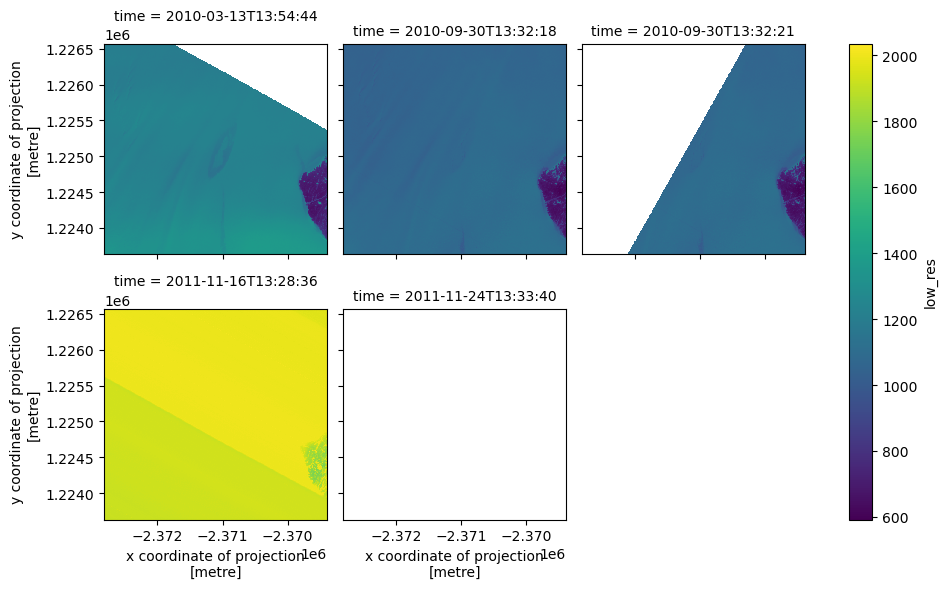

In [103]:
ds.isel(time = slice(0,5), band = 1).plot(col = 'time', col_wrap=3)

In [8]:
max_val = ds.max(dim = ['x', 'y'])
min_val = ds.min(dim = ['x', 'y'])
ds_n = (ds - min_val) / (max_val - min_val)
ds_n

<xarray.DataArray 'low_res' (time: 111, band: 8, y: 459, x: 522)> Size: 851MB
array([[[[0.737475  , 0.73146296, 0.7294589 , ...,        nan,
                 nan,        nan],
         [0.741483  , 0.73146296, 0.73947895, ...,        nan,
                 nan,        nan],
         [0.7274549 , 0.73947895, 0.7334669 , ...,        nan,
                 nan,        nan],
         ...,
         [0.90781564, 0.91182363, 0.92785573, ..., 0.9198397 ,
          0.9238477 , 0.9218437 ],
         [0.92785573, 0.9238477 , 0.9238477 , ..., 0.91783565,
          0.91382766, 0.92785573],
         [0.9158317 , 0.9018036 , 0.9158317 , ..., 0.9238477 ,
          0.9238477 , 0.9238477 ]],

        [[0.6802974 , 0.68649316, 0.6802974 , ...,        nan,
                 nan,        nan],
         [0.6802974 , 0.67905825, 0.6753408 , ...,        nan,
                 nan,        nan],
         [0.69268894, 0.68525404, 0.67905825, ...,        nan,
                 nan,        nan],
...
                 nan,        nan],
         [       nan,        nan,        nan, ...,        nan,
                 nan,        nan],
         [       nan,        nan,        nan, ...,        nan,
                 nan,        nan]],

        [[       nan,        nan,        nan, ...,        nan,
                 nan,        nan],
         [       nan,        nan,        nan, ...,        nan,
                 nan,        nan],
         [       nan,        nan,        nan, ...,        nan,
                 nan,        nan],
         ...,
         [       nan,        nan,        nan, ...,        nan,
                 nan,        nan],
         [       nan,        nan,        nan, ...,        nan,
                 nan,        nan],
         [       nan,        nan,        nan, ...,        nan,
                 nan,        nan]]]],
      shape=(111, 8, 459, 522), dtype=float32)
Coordinates:
  * band             (band) int64 64B 1 2 3 4 5 6 7 8
  * x                (x) float64 4kB -2.373e+06 -2.373e+06 ... -2.369e+06
  * y                (y) float64 4kB 1.227e+06 1.227e+06 ... 1.224e+06 1.224e+06
    spatial_ref      int64 8B 0
  * time             (time) datetime64[ns] 888B 2010-03-13T13:54:44 ... 2024-...
    number_of_bands  (time) int64 888B 4 4 4 8 1 8 1 1 1 1 ... 8 8 1 8 1 8 8 1 1

(array([ 1210287.,  1994781.,  5063690.,  8900812., 13153115., 19415260.,
        21704161., 16717989.,  9112847.,  3782485.]),
 array([0.        , 0.1       , 0.2       , 0.30000001, 0.40000001,
        0.5       , 0.60000002, 0.69999999, 0.80000001, 0.90000004,
        1.        ]),
 <BarContainer object of 10 artists>)

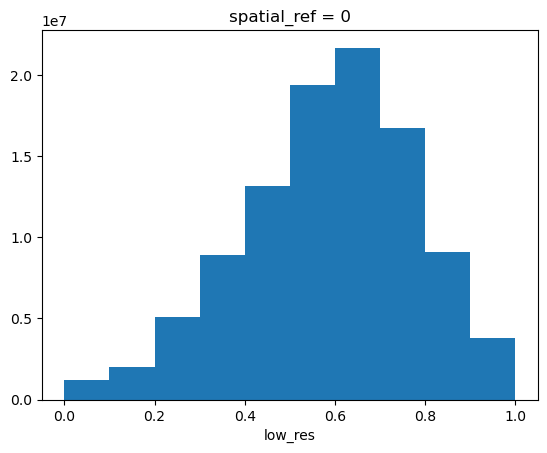

In [105]:
ds_n.plot.hist()

In [109]:
ds_n.isel(time = 5)

<xarray.DataArray 'low_res' (band: 8, y: 459, x: 522)> Size: 8MB
array([[[       nan,        nan,        nan, ..., 0.3939394 ,
         0.42424244, 0.46969697],
        [       nan,        nan,        nan, ..., 0.37878788,
         0.43939394, 0.43939394],
        [       nan,        nan,        nan, ..., 0.3939394 ,
         0.42424244, 0.43939394],
        ...,
        [       nan,        nan,        nan, ..., 0.8181818 ,
         0.75757575, 0.8181818 ],
        [       nan,        nan,        nan, ..., 0.6969697 ,
         0.7878788 , 0.8181818 ],
        [       nan,        nan,        nan, ..., 0.7878788 ,
         0.75757575, 0.7121212 ]],

       [[       nan,        nan,        nan, ..., 0.45652175,
         0.4347826 , 0.4347826 ],
        [       nan,        nan,        nan, ..., 0.5869565 ,
         0.5       , 0.47826087],
        [       nan,        nan,        nan, ..., 0.4347826 ,
         0.5217391 , 0.45652175],
...
        [       nan,        nan,        nan, ..., 0.7419355 ,
         0.6451613 , 0.8064516 ],
        [       nan,        nan,        nan, ..., 0.7096774 ,
         0.7096774 , 0.7096774 ],
        [       nan,        nan,        nan, ..., 0.7419355 ,
         0.83870965, 0.7096774 ]],

       [[       nan,        nan,        nan, ..., 0.33333334,
         0.35897437, 0.33333334],
        [       nan,        nan,        nan, ..., 0.37179488,
         0.3846154 , 0.37179488],
        [       nan,        nan,        nan, ..., 0.35897437,
         0.37179488, 0.35897437],
        ...,
        [       nan,        nan,        nan, ..., 0.61538464,
         0.6025641 , 0.61538464],
        [       nan,        nan,        nan, ..., 0.5769231 ,
         0.64102566, 0.65384614],
        [       nan,        nan,        nan, ..., 0.5641026 ,
         0.5769231 , 0.5641026 ]]], shape=(8, 459, 522), dtype=float32)
Coordinates:
  * band         (band) int64 64B 1 2 3 4 5 6 7 8
  * x            (x) float64 4kB -2.373e+06 -2.373e+06 ... -2.369e+06 -2.369e+06
  * y            (y) float64 4kB 1.227e+06 1.227e+06 ... 1.224e+06 1.224e+06
    spatial_ref  int64 8B 0
    time         datetime64[ns] 8B 2011-12-12T14:12:59

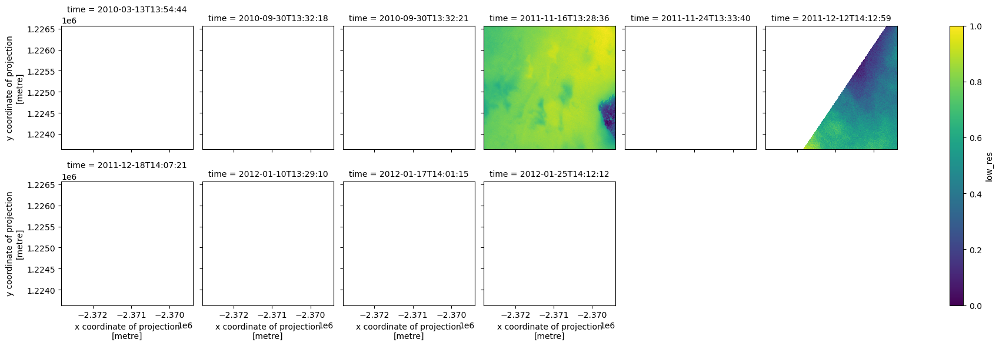

In [119]:
ds_n.isel(band = 7, time = slice(0,10)).plot(col = 'time', col_wrap=6)

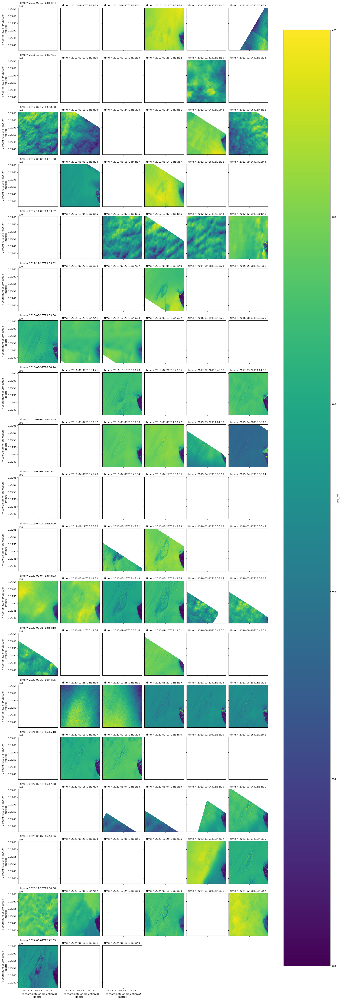

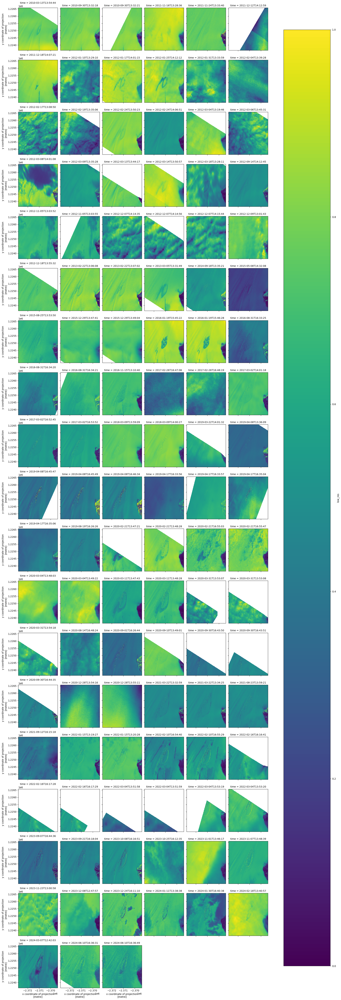

In [111]:
ds_n.isel(band = 0).plot(col = 'time', col_wrap=6)

In [9]:
def rgb_plot(ds):

    # if ds 
    rgb = ds.isel(band =[4,2,1])
    min_val = rgb.min()
    max_val = rgb.max()
    normalized_array = (rgb - min_val) / (max_val - min_val)

    fig, ax = plt.subplots()

    normalized_array.plot.imshow(ax=ax)
    plt.gca().set_aspect('equal') 
    return fig, ax

(<Figure size 640x480 with 1 Axes>,
 <Axes: title={'center': 'spatial_ref = 0, time = 2024-06-10T16:36:49, nu...'}, xlabel='x coordinate of projection\n[metre]', ylabel='y coordinate of projection\n[metre]'>)

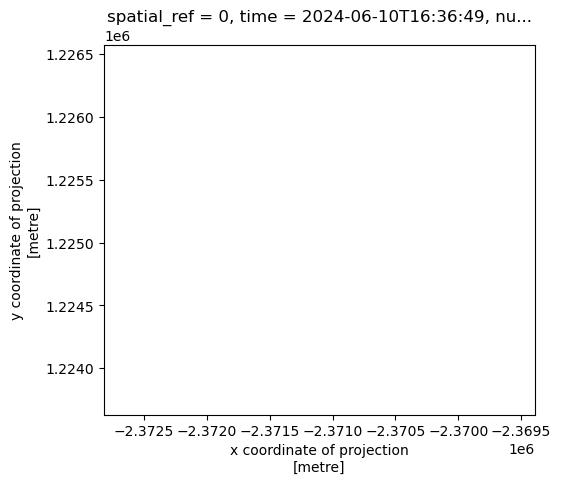

In [ ]:
rgb_plot(ds_n.sel(time=t))
# save as pdf


In [17]:
# iterate over time in ds_n
for t in tqdm.tqdm(ds_n.time[:]):
    if ds_n.sel(time=t).number_of_bands == 8:
        rgb_plot(ds_n.sel(time=t))
    else:
        ds_n.sel(time=t).isel(band =0).plot.imshow(cmap='gray', add_colorbar = False)
        plt.gca().set_aspect('equal')  
    
    plt.savefig(f"rgb_plots/time_{t.values}.pdf")
    plt.close()

100%|██████████| 111/111 [00:10<00:00, 10.75it/s]


<xarray.DataArray 'low_res' (time: 111, band: 8)> Size: 4kB
array([[65535., 65535., 65535., 65535.,    nan,    nan,    nan,    nan],
       [  848.,  1241.,   895.,   819.,    nan,    nan,    nan,    nan],
       [65535., 65535., 65535., 65535.,    nan,    nan,    nan,    nan],
       [ 1842.,  2036.,  2038.,  2037.,  1703.,  2047.,  1684.,  1526.],
       [ 2047.,    nan,    nan,    nan,    nan,    nan,    nan,    nan],
       [65535., 65535., 65535., 65535., 65535., 65535., 65535., 65535.],
       [  861.,    nan,    nan,    nan,    nan,    nan,    nan,    nan],
       [  722.,    nan,    nan,    nan,    nan,    nan,    nan,    nan],
       [65535.,    nan,    nan,    nan,    nan,    nan,    nan,    nan],
       [  817.,    nan,    nan,    nan,    nan,    nan,    nan,    nan],
       [65535., 65535., 65535., 65535., 65535., 65535., 65535., 65535.],
       [  686.,    nan,    nan,    nan,    nan,    nan,    nan,    nan],
       [ 1100.,  1946.,  2047.,  1514.,   800.,  1454.,   844.,  1061.],
       [65535., 65535., 65535., 65535., 65535., 65535., 65535., 65535.],
       [65535., 65535., 65535., 65535.,    nan,    nan,    nan,    nan],
       [ 1099.,    nan,    nan,    nan,    nan,    nan,    nan,    nan],
       [65535., 65535., 65535., 65535., 65535., 65535., 65535., 65535.],
       [65535., 65535., 65535., 65535., 65535., 65535., 65535., 65535.],
       [ 2045.,    nan,    nan,    nan,    nan,    nan,    nan,    nan],
       [65535., 65535., 65535., 65535., 65535., 65535., 65535., 65535.],
...
       [65535., 65535., 65535., 65535., 65535., 65535., 65535., 65535.],
       [65535., 65535., 65535., 65535., 65535., 65535., 65535., 65535.],
       [65535., 65535., 65535., 65535., 65535., 65535., 65535., 65535.],
       [65535., 65535., 65535., 65535., 65535., 65535., 65535., 65535.],
       [ 1625.,    nan,    nan,    nan,    nan,    nan,    nan,    nan],
       [ 1382.,    nan,    nan,    nan,    nan,    nan,    nan,    nan],
       [ 1159.,    nan,    nan,    nan,    nan,    nan,    nan,    nan],
       [  555.,    nan,    nan,    nan,    nan,    nan,    nan,    nan],
       [  866.,  1285.,  1813.,  1077.,  1023.,  1001.,  1003.,   872.],
       [ 1362.,  1376.,  1847.,  1583.,  1104.,  1386.,  1035.,  1387.],
       [ 1195.,  1213.,  1663.,  1480.,  1036.,  1303.,  1013.,  1355.],
       [ 1194.,  1031.,  1510.,  1503.,  1382.,  1248.,  1267.,  1048.],
       [ 1241.,    nan,    nan,    nan,    nan,    nan,    nan,    nan],
       [ 1164.,  1013.,  1473.,  1536.,  1391.,  1366.,  1357.,  1148.],
       [ 1432.,    nan,    nan,    nan,    nan,    nan,    nan,    nan],
       [  892.,   983.,  1321.,   767.,   728.,   697.,   694.,   770.],
       [ 1002.,  1383.,  1960.,  1537.,  1926.,  1328.,  1717.,   833.],
       [65535.,    nan,    nan,    nan,    nan,    nan,    nan,    nan],
       [   99.,    nan,    nan,    nan,    nan,    nan,    nan,    nan]],
      dtype=float32)
Coordinates:
  * band         (band) int64 64B 1 2 3 4 5 6 7 8
    spatial_ref  int64 8B 0
  * time         (time) datetime64[ns] 888B 2010-03-13T13:54:44 ... 2024-06-1...

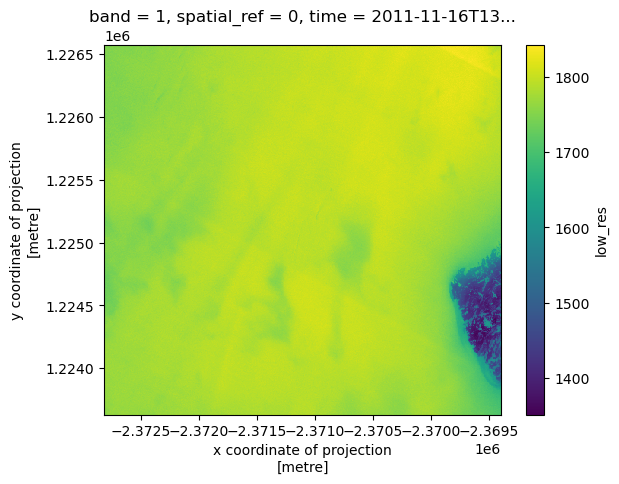

In [91]:
ds.isel(time = 3, band = 0).plot()

<xarray.DataArray 'low_res' (time: 111, band: 8, y: 459, x: 522)> Size: 851MB
array([[[[8.3600e+02, 8.3300e+02, 8.3200e+02, ..., 6.5535e+04,
          6.5535e+04, 6.5535e+04],
         [8.3800e+02, 8.3300e+02, 8.3700e+02, ..., 6.5535e+04,
          6.5535e+04, 6.5535e+04],
         [8.3100e+02, 8.3700e+02, 8.3400e+02, ..., 6.5535e+04,
          6.5535e+04, 6.5535e+04],
         ...,
         [9.2100e+02, 9.2300e+02, 9.3100e+02, ..., 9.2700e+02,
          9.2900e+02, 9.2800e+02],
         [9.3100e+02, 9.2900e+02, 9.2900e+02, ..., 9.2600e+02,
          9.2400e+02, 9.3100e+02],
         [9.2500e+02, 9.1800e+02, 9.2500e+02, ..., 9.2900e+02,
          9.2900e+02, 9.2900e+02]],

        [[1.1910e+03, 1.1960e+03, 1.1910e+03, ..., 6.5535e+04,
          6.5535e+04, 6.5535e+04],
         [1.1910e+03, 1.1900e+03, 1.1870e+03, ..., 6.5535e+04,
          6.5535e+04, 6.5535e+04],
         [1.2010e+03, 1.1950e+03, 1.1900e+03, ..., 6.5535e+04,
          6.5535e+04, 6.5535e+04],
...
                 nan,        nan],
         [       nan,        nan,        nan, ...,        nan,
                 nan,        nan],
         [       nan,        nan,        nan, ...,        nan,
                 nan,        nan]],

        [[       nan,        nan,        nan, ...,        nan,
                 nan,        nan],
         [       nan,        nan,        nan, ...,        nan,
                 nan,        nan],
         [       nan,        nan,        nan, ...,        nan,
                 nan,        nan],
         ...,
         [       nan,        nan,        nan, ...,        nan,
                 nan,        nan],
         [       nan,        nan,        nan, ...,        nan,
                 nan,        nan],
         [       nan,        nan,        nan, ...,        nan,
                 nan,        nan]]]],
      shape=(111, 8, 459, 522), dtype=float32)
Coordinates:
  * band         (band) int64 64B 1 2 3 4 5 6 7 8
  * x            (x) float64 4kB -2.373e+06 -2.373e+06 ... -2.369e+06 -2.369e+06
  * y            (y) float64 4kB 1.227e+06 1.227e+06 ... 1.224e+06 1.224e+06
    spatial_ref  int64 8B 0
  * time         (time) datetime64[ns] 888B 2010-03-13T13:54:44 ... 2024-06-1...
Attributes: (12/126)
    NITF_ABPP:                            11
    NITF_CCS_COLUMN:                      0
    NITF_CCS_ROW:                         0
    NITF_CLEVEL:                          5
    NITF_CSDIDA_DAY:                      13
    NITF_CSDIDA_MONTH:                    MAR
    ...                                   ...
    STATISTICS_STDDEV:                    86.824565063575
    STATISTICS_VALID_PERCENT:             53.14
    AREA_OR_POINT:                        Area
    scale_factor:                         1.0
    add_offset:                           0.0
    _FillValue:                           65535

In [71]:
images = []

for i, tif_subset_file in enumerate(tif_subset_files[0:3]):
    print(f"Processing , {i}, {tif_subset_file}...")
    temp = resample(rioxarray.open_rasterio(tif_subset_file))
    images.append(temp.assign_coords({"time": df.index[i]}))
all = xr.concat(images, dim="time")

Processing , 0, lake_subset/WV02_20210823135921_10300100C3530C00_21AUG23135921-P1BS-505726517100_01_P008_u16ns3031.tif...
Processing , 1, lake_subset/WV02_20240111133838_10300100F21D4000_24JAN11133838-P1BS-508155588050_01_P001_u16ns3031.tif...
Processing , 2, lake_subset/WV03_20151229134904_1040010015AD7200_15DEC29134904-M1BS-500633738050_01_P008_u16ns3031.tif...


In [72]:
all.time

<xarray.DataArray 'time' (time: 3)> Size: 24B
array(['2010-03-13T13:54:44.000000000', '2010-09-30T13:32:18.000000000',
       '2010-09-30T13:32:21.000000000'], dtype='datetime64[ns]')
Coordinates:
    spatial_ref  int64 8B 0
  * time         (time) datetime64[ns] 24B 2010-03-13T13:54:44 ... 2010-09-30...

<xarray.DataArray 'low_res' (band: 1, y: 459, x: 522)> Size: 479kB
array([[[555, 603, 510, ..., 506, 499, 485],
        [520, 517, 529, ..., 487, 488, 482],
        [494, 562, 575, ..., 509, 455, 493],
        ...,
        [289, 287, 306, ..., 510, 495, 499],
        [440, 550, 654, ..., 503, 484, 471],
        [477, 477, 449, ..., 499, 494, 462]]],
      shape=(1, 459, 522), dtype=uint16)
Coordinates:
  * band         (band) int64 8B 1
    spatial_ref  int64 8B 0
  * x            (x) float64 4kB -2.373e+06 -2.373e+06 ... -2.369e+06 -2.369e+06
  * y            (y) float64 4kB 1.227e+06 1.227e+06 ... 1.224e+06 1.224e+06
    time         datetime64[ns] 8B 2010-03-13T13:54:44
Attributes: (12/126)
    NITF_ABPP:                            11
    NITF_CCS_COLUMN:                      0
    NITF_CCS_ROW:                         0
    NITF_CLEVEL:                          6
    NITF_CSDIDA_DAY:                      23
    NITF_CSDIDA_MONTH:                    AUG
    ...                                   ...
    STATISTICS_STDDEV:                    190.92338410447
    STATISTICS_VALID_PERCENT:             49.59
    AREA_OR_POINT:                        Area
    scale_factor:                         1.0
    add_offset:                           0.0
    _FillValue:                           65535

In [21]:
xr.concat([high_res, low_res_2],dim = 'time')

<xarray.DataArray 'high_res' (time: 2, band: 1, y: 5050, x: 5751)> Size: 232MB
array([[[[507., 507., 487., ..., 484., 489., 496.],
         [527., 482., 477., ..., 476., 480., 484.],
         [473., 444., 448., ..., 478., 479., 486.],
         ...,
         [585., 561., 509., ..., 447., 447., 455.],
         [594., 587., 545., ..., 446., 456., 455.],
         [613., 613., 600., ..., 471., 469., 471.]]],


       [[[ nan,  nan,  nan, ...,  nan,  nan,  nan],
         [ nan,  nan,  nan, ...,  nan,  nan,  nan],
         [ nan,  nan,  nan, ...,  nan,  nan,  nan],
         ...,
         [ nan,  nan,  nan, ...,  nan,  nan,  nan],
         [ nan,  nan,  nan, ...,  nan,  nan,  nan],
         [ nan,  nan,  nan, ...,  nan,  nan,  nan]]]],
      shape=(2, 1, 5050, 5751), dtype=float32)
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 46kB -2.373e+06 -2.373e+06 ... -2.369e+06
  * y            (y) float64 40kB 1.224e+06 1.224e+06 ... 1.227e+06 1.227e+06
    spatial_ref  int64 8B 0
Dimensions without coordinates: time
Attributes: (12/126)
    NITF_ABPP:                            11
    NITF_CCS_COLUMN:                      0
    NITF_CCS_ROW:                         0
    NITF_CLEVEL:                          6
    NITF_CSDIDA_DAY:                      23
    NITF_CSDIDA_MONTH:                    AUG
    ...                                   ...
    STATISTICS_STDDEV:                    190.92338410447
    STATISTICS_VALID_PERCENT:             49.59
    AREA_OR_POINT:                        Area
    _FillValue:                           65535
    scale_factor:                         1.0
    add_offset:                           0.0

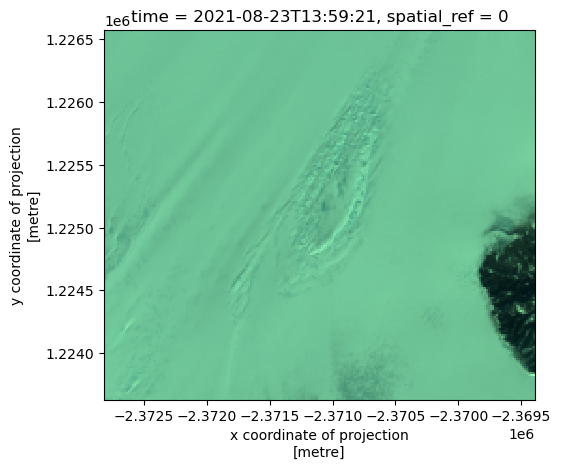

In [39]:
tif_subset_files = glob.glob('lake_subset/*2023*.tif') + glob.glob('lake_subset/*2024*.tif')
dss= []
for i, tif_subset_file in enumerate(tif_subset_files[0:1]):
    temp = rioxarray.open_rasterio(tif_subset_file).rio.clip_box(*bounds).squeeze()
    temp['time'] = t[i]
    new_width = temp.rio.width //10
    new_height = temp.rio.height //10
    temp_upsampled = temp.rio.reproject(
                    temp.rio.crs,
                    shape=(new_height, new_width),
                    resampling=Resampling.bilinear,
                )

    if temp_upsampled.sizes['band'] == 8:
        rgb_plot(temp_upsampled)
    else:
        temp_upsampled.plot()
    plt.show()
    


In [31]:
#length of band dim
print("Length of band dimension:", temp_upsampled.rio.shape[0])


Length of band dimension: 184


In [38]:
temp_upsampled.sizes['band']

8

In [ ]:

dss = [rioxarray.open_rasterio(tif_subset_file).rio.clip_box(*bounds).squeeze() for tif_subset_file in tif_subset_files]
dss[0]# = xr.concat(dss, dim='time')

<xarray.DataArray (band: 8, y: 1841, x: 2302)> Size: 68MB
[33903856 values with dtype=uint16]
Coordinates:
  * band         (band) int64 64B 1 2 3 4 5 6 7 8
  * x            (x) float64 18kB -2.373e+06 -2.373e+06 ... -2.369e+06
  * y            (y) float64 15kB 1.227e+06 1.227e+06 ... 1.224e+06 1.224e+06
    spatial_ref  int64 8B 0
Attributes: (12/126)
    NITF_ABPP:                            11
    NITF_CCS_COLUMN:                      0
    NITF_CCS_ROW:                         0
    NITF_CLEVEL:                          6
    NITF_CSDIDA_DAY:                      7
    NITF_CSDIDA_MONTH:                    NOV
    ...                                   ...
    STATISTICS_STDDEV:                    193.10237163779
    STATISTICS_VALID_PERCENT:             52.08
    AREA_OR_POINT:                        Area
    scale_factor:                         1.0
    add_offset:                           0.0
    _FillValue:                           65535

In [ ]:
mask = (df >= "2023") & (df <= "2024")
filtered = t[mask]


TypeError: Cannot pass DataFrame to 'pandas.array'

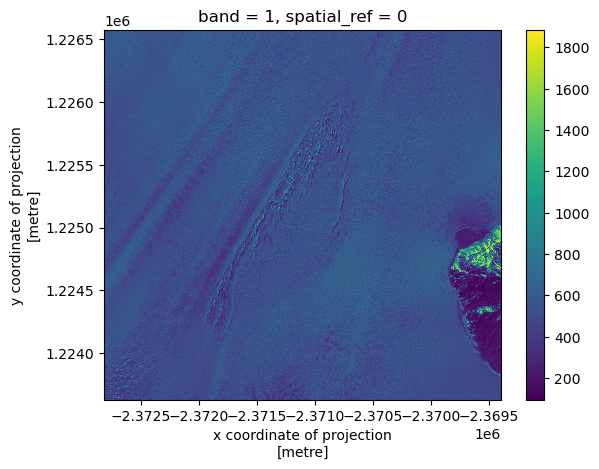

In [34]:
ds_temp.plot()


In [ ]:
mask = (t >= "2023") & (t <= "2024")
filtered = t[mask]
filtered

DatetimeIndex(['2023-11-07 13:48:39', '2023-11-07 13:48:39',
               '2023-09-21 16:18:04', '2023-09-07 16:44:36',
               '2023-12-08 12:47:57', '2023-12-08 12:47:57',
               '2023-12-24 16:11:10', '2023-11-23 13:00:58',
               '2023-11-23 13:00:58', '2023-10-25 16:12:35',
               '2023-11-01 13:46:17', '2023-11-01 13:46:17',
               '2023-10-08 16:16:51'],
              dtype='datetime64[ns]', freq=None)